# 1. Problem Statement

### 1 billion hours of Youtube are watched per day. It is the 2nd most visited site in the world.

### YouTube attracts 44% of all internet users whereas 37% of all mobile internet traffic belongs to YouTube

# 2.SENTIMENTS

In [1]:
import numpy as np #for numerical data
import pandas as pd #for data manipulation
import matplotlib.pyplot as plt #for vis
import seaborn as sns

In [2]:
df_comments = pd.read_csv ("GBcomments.xls" , error_bad_lines = False)
df_comments

C:\Users\tessk\anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3444: FutureWarning: The error_bad_lines argument has been deprecated and will be removed in a future version.


  exec(code_obj, self.user_global_ns, self.user_ns)
b'Skipping line 113225: expected 4 fields, saw 5\n'
b'Skipping line 158379: expected 4 fields, saw 7\nSkipping line 241590: expected 4 fields, saw 5\nSkipping line 245637: expected 4 fields, saw 7\n'
b'Skipping line 521402: expected 4 fields, saw 5\n'


,video_id,comment_text,likes,replies
0,jt2OHQh0HoQ,It's more accurate to call it the M+ (1000) be...,0,0
1,jt2OHQh0HoQ,To be there with a samsung phone\n😂😂😂,1,0
2,jt2OHQh0HoQ,"Thank gosh, a place I can watch it without hav...",0,0
3,jt2OHQh0HoQ,What happened to the home button on the iPhone...,0,0
4,jt2OHQh0HoQ,Power is the disease. Care is the cure. Keep...,0,0
...,...,...,...,...
718447,lLN1FwiqGwc,MEME ME MEME ME MEME ME,0,0
718448,lLN1FwiqGwc,"Yeah, but does everybody float?",0,0
718449,lLN1FwiqGwc,That meme me dace 😂,0,0
718450,lLN1FwiqGwc,10:43 Is that Miles Upshur????,2,0


In [3]:
df_comments.head(5)

,video_id,comment_text,likes,replies
0,jt2OHQh0HoQ,It's more accurate to call it the M+ (1000) be...,0,0
1,jt2OHQh0HoQ,To be there with a samsung phone\n😂😂😂,1,0
2,jt2OHQh0HoQ,"Thank gosh, a place I can watch it without hav...",0,0
3,jt2OHQh0HoQ,What happened to the home button on the iPhone...,0,0
4,jt2OHQh0HoQ,Power is the disease. Care is the cure. Keep...,0,0


#### we are now performing sentiment analysis with respect to "comment_text" feature on the above

#### to do this, we install an external library called textblob library (pip install textblob on conda prompt)

In [4]:
from textblob import TextBlob

In [5]:
TextBlob("It's more accurate to call it the M+ (1000) be...").sentiment.polarity

0.45000000000000007

In [6]:
df_comments.isna().sum() #to get the sum of all missing values

video_id         0
comment_text    28
likes            0
replies          0
dtype: int64

In [7]:
df_comments.dropna(inplace=True) #to drop all null values

In [8]:
polarity = []

for i in df_comments ["comment_text"]:
    polarity.append(TextBlob(i).sentiment.polarity)

In [9]:
df_comments["polarity"] = polarity

In [10]:
df_comments.head(20)

,video_id,comment_text,likes,replies,polarity
0,jt2OHQh0HoQ,It's more accurate to call it the M+ (1000) be...,0,0,0.450000
1,jt2OHQh0HoQ,To be there with a samsung phone\n😂😂😂,1,0,0.000000
2,jt2OHQh0HoQ,"Thank gosh, a place I can watch it without hav...",0,0,0.000000
3,jt2OHQh0HoQ,What happened to the home button on the iPhone...,0,0,0.000000
4,jt2OHQh0HoQ,Power is the disease. Care is the cure. Keep...,0,0,1.000000
5,jt2OHQh0HoQ,Keep calm and buy iphone 8 Keep calm and buy i...,0,0,0.300000
6,jt2OHQh0HoQ,i am a big fan of youtube and u !!!!!!!!!!!!!,0,0,0.000000
7,jt2OHQh0HoQ,You will never find Losers who line up and pay...,0,0,-0.100000
8,jt2OHQh0HoQ,*APPLE JUST COMMENTED ON MY LAST VIDEO* I'm cr...,0,0,0.028571
9,jt2OHQh0HoQ,"I'm only here to see Emma, I love her so much!...",0,0,0.500000


# 3. EDA FOR POSITIVE SENTIMENTS

### we need positive polarity for this step. Therefore we are going to set the positive polarity as ==1

### I am going to create and parse a filter in the data frame

In [11]:
df_comments_positive = df_comments[df_comments["polarity"] ==1]

In [12]:
df_comments_positive.shape

(20400, 5)

In [13]:
df_comments_positive.head()

,video_id,comment_text,likes,replies,polarity
4,jt2OHQh0HoQ,Power is the disease. Care is the cure. Keep...,0,0,1.0
26,jt2OHQh0HoQ,The best thing to ever happen to iPhone,0,2,1.0
80,jt2OHQh0HoQ,Apple is always awesome \n\nhttps://youtu.be/r...,0,1,1.0
158,YPVcg45W0z4,das a lot of edditing you have done there ... ...,0,0,1.0
175,YPVcg45W0z4,Welcome to the Scandiworld!,0,0,1.0


### to visualize 'comment_text' feature we pip install worldcloud for comments. it is a tool to show how important a word is in a feature

In [14]:
from wordcloud import WordCloud, STOPWORDS

In [15]:
stopwords = set(STOPWORDS)

In [16]:
''.join (df_comments_positive["comment_text"]) #this is the entire data to parse into wordcloud it's a chunk of data

"Power is the disease.\xa0 Care is the cure.\xa0 Keep caring for yourself and others as best as you can.\xa0 This is life.The best thing to ever happen to iPhoneApple is always awesome \\n\\nhttps://youtu.be/rftzm6X1yP4das a lot of edditing you have done there ... I like it :DWelcome to the Scandiworld!Power is the disease.\xa0 Care is the cure.\xa0 Keep caring for yourself and others as best as you can.\xa0 This is life.WHY DO I KEEP FREAKING LAUGHING EACH TIME I WATCH IT AGAIN ! even though I know how it will end. omg the best 😂LIKE = MEET CELEBRITY \\nSUBSCRIBE = BECOME A BILLIONAIRE\\nSCROLL UP/DOWN = DEATH FOR YOU AND EVERYONE YOU LOVE!!!!!!!!!!!!!!!!!!!!!!!!!!!!!the sonic air timer was perfectno 16 on trending impressiveMy daughters name is lacey <3I'm 17 and can proudly say Moon Dreamers was one of my favourite shows!if I could subscribe to Dude Perfect a million times I wouldYou guys should make dude perfect sceetsTo be a dude perfect member it is so awesome ....Dude Perfect sh

In [17]:
total_df_comments = ''.join (df_comments_positive["comment_text"])

In [18]:
wordcloud= WordCloud(width = 1000, height = 500, stopwords = stopwords).generate(total_df_comments)

(-0.5, 999.5, 499.5, -0.5)

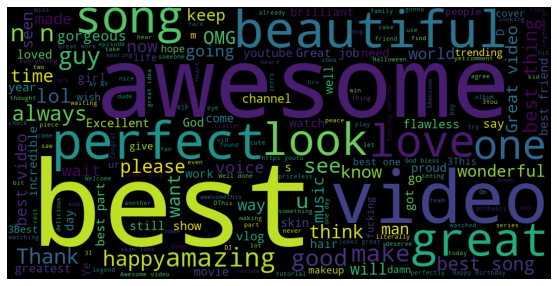

In [19]:
plt.figure(figsize = (15,5))
plt.imshow(wordcloud)
plt.axis("off")

### from this, we see the most common positive words as "AWESOME, BEST, VIDEO, PERFECT".
### The bigger the size of the word, the bigger the polarity it has

# 4. EDA FOR NEGATIVE SENTIMENTS

In [20]:
df_comments_negative = df_comments[df_comments["polarity"] ==-1]

In [21]:
total_df_comments = ''.join (df_comments_negative["comment_text"])

In [22]:
wordcloud= WordCloud(width = 1000, height = 500, stopwords = stopwords).generate(total_df_comments)

(-0.5, 999.5, 499.5, -0.5)

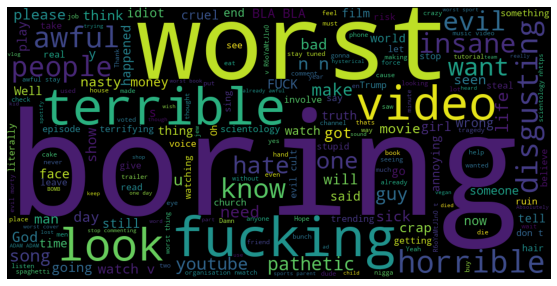

In [23]:
plt.figure(figsize = (15,5))
plt.imshow(wordcloud)
plt.axis("off")

# 5. ANALYSING TAGS COLUMN, WHAT ARE THE TRENDING TAGS ON YOUTUBE?

In [24]:
df_videos = pd.read_csv("USvideos.csv") #when you run, you will come accross a Parse error. To clear this, set a parameter, "error_bad_lines = False"

ParserError: Error tokenizing data. C error: Expected 11 fields in line 2401, saw 21


In [25]:
df_videos = pd.read_csv("USvideos.csv", error_bad_lines = False)
df_videos

C:\Users\tessk\anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3444: FutureWarning: The error_bad_lines argument has been deprecated and will be removed in a future version.


  exec(code_obj, self.user_global_ns, self.user_ns)
b'Skipping line 2401: expected 11 fields, saw 21\nSkipping line 2800: expected 11 fields, saw 21\nSkipping line 5297: expected 11 fields, saw 12\nSkipping line 5299: expected 11 fields, saw 12\nSkipping line 5300: expected 11 fields, saw 12\nSkipping line 5301: expected 11 fields, saw 12\n'


,video_id,title,channel_title,category_id,tags,views,likes,dislikes,comment_total,thumbnail_link,date
0,XpVt6Z1Gjjo,1 YEAR OF VLOGGING -- HOW LOGAN PAUL CHANGED Y...,Logan Paul Vlogs,24,logan paul vlog|logan paul|logan|paul|olympics...,4394029,320053,5931,46245,https://i.ytimg.com/vi/XpVt6Z1Gjjo/default.jpg,13.09
1,K4wEI5zhHB0,iPhone X — Introducing iPhone X — Apple,Apple,28,Apple|iPhone 10|iPhone Ten|iPhone|Portrait Lig...,7860119,185853,26679,0,https://i.ytimg.com/vi/K4wEI5zhHB0/default.jpg,13.09
2,cLdxuaxaQwc,My Response,PewDiePie,22,[none],5845909,576597,39774,170708,https://i.ytimg.com/vi/cLdxuaxaQwc/default.jpg,13.09
3,WYYvHb03Eog,Apple iPhone X first look,The Verge,28,apple iphone x hands on|Apple iPhone X|iPhone ...,2642103,24975,4542,12829,https://i.ytimg.com/vi/WYYvHb03Eog/default.jpg,13.09
4,sjlHnJvXdQs,iPhone X (parody),jacksfilms,23,jacksfilms|parody|parodies|iphone|iphone x|iph...,1168130,96666,568,6666,https://i.ytimg.com/vi/sjlHnJvXdQs/default.jpg,13.09
...,...,...,...,...,...,...,...,...,...,...,...
7987,xlu6i6lT_vk,How Do MASSIVE Sinkholes Form?,Life Noggin,27,sinkhole|how do sinkholes form|sinkhole in wat...,440393,14362,390,1575,https://i.ytimg.com/vi/xlu6i6lT_vk/default.jpg,22.10
7988,qRoVlH1OcI4,Trump slams Clinton for defending NFL anthem p...,Business Insider,25,Business Insider|Donald Trump|Hillary Clinton|...,55762,1265,760,1873,https://i.ytimg.com/vi/qRoVlH1OcI4/default.jpg,22.10
7989,EoejGgUNmVU,LP - Lost On You (A Night at The McKittrick Ho...,LP,10,LP|Death Valley|Other People|Lost On You|The M...,142908,7088,68,437,https://i.ytimg.com/vi/EoejGgUNmVU/default.jpg,22.10
7990,MT1CMTI0EVw,Tré Melvin @ #YouTubeBlack FanFest Washington ...,YouTube FanFest,24,YouTube FanFest|#YTFF|Washington DC|USA|YTFF|#...,24532,2148,77,0,https://i.ytimg.com/vi/MT1CMTI0EVw/default.jpg,22.10


In [26]:
df_videos.head()

,video_id,title,channel_title,category_id,tags,views,likes,dislikes,comment_total,thumbnail_link,date
0,XpVt6Z1Gjjo,1 YEAR OF VLOGGING -- HOW LOGAN PAUL CHANGED Y...,Logan Paul Vlogs,24,logan paul vlog|logan paul|logan|paul|olympics...,4394029,320053,5931,46245,https://i.ytimg.com/vi/XpVt6Z1Gjjo/default.jpg,13.09
1,K4wEI5zhHB0,iPhone X — Introducing iPhone X — Apple,Apple,28,Apple|iPhone 10|iPhone Ten|iPhone|Portrait Lig...,7860119,185853,26679,0,https://i.ytimg.com/vi/K4wEI5zhHB0/default.jpg,13.09
2,cLdxuaxaQwc,My Response,PewDiePie,22,[none],5845909,576597,39774,170708,https://i.ytimg.com/vi/cLdxuaxaQwc/default.jpg,13.09
3,WYYvHb03Eog,Apple iPhone X first look,The Verge,28,apple iphone x hands on|Apple iPhone X|iPhone ...,2642103,24975,4542,12829,https://i.ytimg.com/vi/WYYvHb03Eog/default.jpg,13.09
4,sjlHnJvXdQs,iPhone X (parody),jacksfilms,23,jacksfilms|parody|parodies|iphone|iphone x|iph...,1168130,96666,568,6666,https://i.ytimg.com/vi/sjlHnJvXdQs/default.jpg,13.09


In [27]:
df_videos["tags"] #to access the tags column

0       logan paul vlog|logan paul|logan|paul|olympics...
1       Apple|iPhone 10|iPhone Ten|iPhone|Portrait Lig...
2                                                  [none]
3       apple iphone x hands on|Apple iPhone X|iPhone ...
4       jacksfilms|parody|parodies|iphone|iphone x|iph...
                              ...                        
7987    sinkhole|how do sinkholes form|sinkhole in wat...
7988    Business Insider|Donald Trump|Hillary Clinton|...
7989    LP|Death Valley|Other People|Lost On You|The M...
7990    YouTube FanFest|#YTFF|Washington DC|USA|YTFF|#...
7991    LIGO|Virgo|collaboration|space|science|nationa...
Name: tags, Length: 7992, dtype: object

In [28]:
' '.join(df_videos["tags"]) #to join all the tags, too get a bunch of tags in a string

"logan paul vlog|logan paul|logan|paul|olympics|logan paul youtube|vlog|daily|comedy|hollywood|parrot|maverick|bird|maverick clothes|diamond play button|logan paul diamond play button|10M subscribers|logan paul 1 year vlogging|1 year vlog|dwarf mamba play button|logan paul history|youtube history|10M|10M plaque|youtube button|diamond button|logang|logang 4 life Apple|iPhone 10|iPhone Ten|iPhone|Portrait Lighting|A11 Bionic|augmented reality|emoji|animoji|Face ID|Apple Pay|camera|smartphone [none] apple iphone x hands on|Apple iPhone X|iPhone X|apple iphone x first look|iPhone X first look|apple iphone x event 2017|apple iphone x event|iPhone X price|iPhone X specs|iPhone X design|iPhone X camera|iPhone X home button|iPhone X wireless charging|iPhone X waterproof|iPhone X release date|iphone 2017|apple|iphone|ios 11|the verge|verge jacksfilms|parody|parodies|iphone|iphone x|iphone 8|apple|emoji a24|a24 films|a24 trailers|independent films|trailer|HD|official|movie|film|a24 movies|oscar 

In [29]:
tags_complete = ' '.join(df_videos["tags"])
tags_complete

"logan paul vlog|logan paul|logan|paul|olympics|logan paul youtube|vlog|daily|comedy|hollywood|parrot|maverick|bird|maverick clothes|diamond play button|logan paul diamond play button|10M subscribers|logan paul 1 year vlogging|1 year vlog|dwarf mamba play button|logan paul history|youtube history|10M|10M plaque|youtube button|diamond button|logang|logang 4 life Apple|iPhone 10|iPhone Ten|iPhone|Portrait Lighting|A11 Bionic|augmented reality|emoji|animoji|Face ID|Apple Pay|camera|smartphone [none] apple iphone x hands on|Apple iPhone X|iPhone X|apple iphone x first look|iPhone X first look|apple iphone x event 2017|apple iphone x event|iPhone X price|iPhone X specs|iPhone X design|iPhone X camera|iPhone X home button|iPhone X wireless charging|iPhone X waterproof|iPhone X release date|iphone 2017|apple|iphone|ios 11|the verge|verge jacksfilms|parody|parodies|iphone|iphone x|iphone 8|apple|emoji a24|a24 films|a24 trailers|independent films|trailer|HD|official|movie|film|a24 movies|oscar 

In [30]:
#there is lots of noise in the above data, we are therefore going to remove it with the fxn below:

In [31]:
import re #ragular expression module for text data

In [32]:
 #using a substitute fxn to remove special characters except A-Z characters. (^'apart from A-Z', replace with space). All this is in the function TAGS             

In [33]:
tags = re.sub ('[^a-zA-Z]', ' ', tags_complete)
tags

'logan paul vlog logan paul logan paul olympics logan paul youtube vlog daily comedy hollywood parrot maverick bird maverick clothes diamond play button logan paul diamond play button   M subscribers logan paul   year vlogging   year vlog dwarf mamba play button logan paul history youtube history   M   M plaque youtube button diamond button logang logang   life Apple iPhone    iPhone Ten iPhone Portrait Lighting A   Bionic augmented reality emoji animoji Face ID Apple Pay camera smartphone  none  apple iphone x hands on Apple iPhone X iPhone X apple iphone x first look iPhone X first look apple iphone x event      apple iphone x event iPhone X price iPhone X specs iPhone X design iPhone X camera iPhone X home button iPhone X wireless charging iPhone X waterproof iPhone X release date iphone      apple iphone ios    the verge verge jacksfilms parody parodies iphone iphone x iphone   apple emoji a   a   films a   trailers independent films trailer HD official movie film a   movies oscar 

In [34]:
tags= re.sub(' + ', ' ', tags)

In [35]:
wordcloud = WordCloud(width = 1000, height = 500, stopwords = set(STOPWORDS)).generate(tags)

(-0.5, 999.5, 499.5, -0.5)

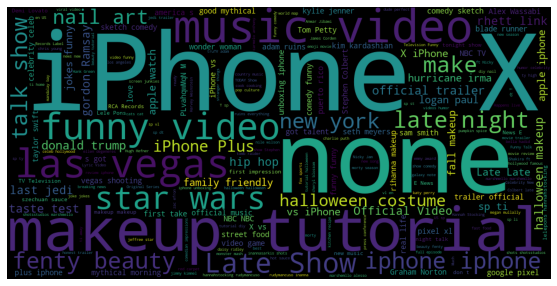

In [36]:
plt.figure(figsize = (15,5))
plt.imshow(wordcloud)
plt.axis('off')

# 6. ANALYSIS ON LIKES, VIEWS & DISLIKES: HOW THEY CORRELATE TO EACH OTHER

### I'll use a regression plot because i'm trying to find the relationship between two variables. This will be done using seaborn

Text(0.5, 1.0, 'Regression plot for views & likes')

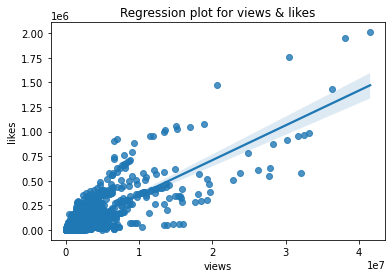

In [37]:
sns. regplot(data= df_videos, x="views", y="likes")
plt.title("Regression plot for views & likes")

Text(0.5, 1.0, 'Regression plot for views & dislikes')

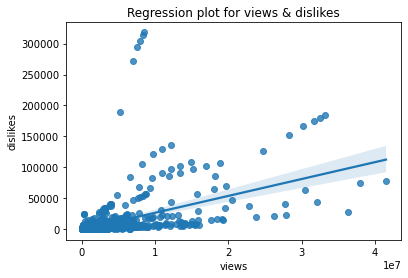

In [38]:
sns. regplot(data= df_videos, x="views", y="dislikes")
plt.title("Regression plot for views & dislikes")

In [39]:
# in the above, when views are increasing, dislikes reduce

### using correlation matrix to see how they are correlated

In [40]:
correlation = df_videos[["views", "likes", "dislikes"]]

In [41]:
correlation.corr()

,views,likes,dislikes
views,1.000000,0.832844,0.541955
likes,0.832844,1.000000,0.497439
dislikes,0.541955,0.497439,1.000000


<AxesSubplot:>

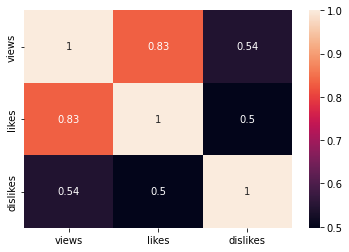

In [42]:
sns.heatmap(correlation.corr(), annot= True)

# 7. EMOJI ANALYSIS ON COMMENTS

In [43]:
df_comments.head()

,video_id,comment_text,likes,replies,polarity
0,jt2OHQh0HoQ,It's more accurate to call it the M+ (1000) be...,0,0,0.45
1,jt2OHQh0HoQ,To be there with a samsung phone\n😂😂😂,1,0,0.00
2,jt2OHQh0HoQ,"Thank gosh, a place I can watch it without hav...",0,0,0.00
3,jt2OHQh0HoQ,What happened to the home button on the iPhone...,0,0,0.00
4,jt2OHQh0HoQ,Power is the disease. Care is the cure. Keep...,0,0,1.00


In [44]:
df_comments["comment_text"][1]

'To be there with a samsung phone\\n😂😂😂'

In [45]:
print("\U0001F600")

😀


In [46]:
import emoji

In [47]:
len(df_comments)

718424

In [48]:
comment = df_comments ['comment_text'][1]

In [49]:
[c for c in comment if c in emoji.UNICODE_EMOJI]

['😂', '😂', '😂']

In [50]:
emoji.__version__

'0.6.0'

In [51]:
str= ' '
for i in df_comments ["comment_text"]:
    list = [c for c in i if c in emoji.UNICODE_EMOJI]
    for ele in list:
        str=str+ele

In [52]:
len(str)

341869

In [53]:
#str will print all the emojis in the youtube text we're analysing 'this is supposed to be a code but it makes the machine hang'

In [54]:
result = {}
for i in set(str):
    result[i]=str.count(i) #to return a value associated with i,

In [55]:
result

{'🌮': 57,
 '🔪': 92,
 '🏍': 8,
 '🏿': 532,
 '⛎': 9,
 '🐿': 15,
 '♏': 14,
 '🔲': 5,
 '🛣': 4,
 '🕋': 8,
 '🚗': 27,
 '🍺': 48,
 '🦉': 7,
 '🈳': 5,
 '✂': 13,
 '🈹': 5,
 '🤾': 1,
 '😀': 1788,
 '🗳': 5,
 '🙉': 49,
 '🏣': 8,
 '🙇': 50,
 '🌆': 8,
 '🎡': 20,
 '🍧': 15,
 '🤞': 105,
 '💛': 2169,
 '⛳': 10,
 '🔥': 10249,
 '🤹': 1,
 '🎨': 33,
 '🚥': 8,
 '➖': 13,
 '🖤': 802,
 '🌖': 20,
 '🤱': 2,
 '😷': 177,
 '💧': 59,
 '🧙': 6,
 '🤗': 1128,
 '🌫': 5,
 '🛋': 5,
 '🚄': 6,
 '😶': 225,
 '🚕': 17,
 '♋': 15,
 '🙎': 12,
 '♦': 5,
 '💡': 63,
 '⭕': 18,
 '🌭': 25,
 '🎆': 162,
 '🗜': 5,
 '☝': 187,
 '👂': 23,
 '🍞': 19,
 '🙄': 765,
 '😥': 860,
 '👤': 28,
 '🗯': 13,
 '🐬': 216,
 '🥕': 7,
 '🍒': 43,
 '🚴': 8,
 '🚷': 11,
 '📒': 19,
 '🐒': 43,
 '🍣': 54,
 '🔑': 36,
 '⛓': 7,
 '💢': 17,
 '🏼': 2961,
 '♻': 6,
 '🤘': 731,
 '🏰': 12,
 '🌎': 127,
 '🖲': 5,
 '🐓': 98,
 '⏹': 4,
 '😉': 1153,
 '🏺': 8,
 '🎇': 149,
 '🏳': 92,
 '🏞': 8,
 '👈': 148,
 '✉': 8,
 '🧚': 7,
 '🌃': 16,
 '💝': 562,
 '👀': 596,
 '🦆': 4,
 '📤': 8,
 '🛤': 5,
 '🈁': 5,
 '🛌': 13,
 '💷': 43,
 '🌦': 19,
 '🐟': 67,
 '💄': 191,
 '🐱': 149,
 '👱'

In [56]:
result.items()

dict_items([('🌮', 57), ('🔪', 92), ('🏍', 8), ('🏿', 532), ('⛎', 9), ('🐿', 15), ('♏', 14), ('🔲', 5), ('🛣', 4), ('🕋', 8), ('🚗', 27), ('🍺', 48), ('🦉', 7), ('🈳', 5), ('✂', 13), ('🈹', 5), ('🤾', 1), ('😀', 1788), ('🗳', 5), ('🙉', 49), ('🏣', 8), ('🙇', 50), ('🌆', 8), ('🎡', 20), ('🍧', 15), ('🤞', 105), ('💛', 2169), ('⛳', 10), ('🔥', 10249), ('🤹', 1), ('🎨', 33), ('🚥', 8), ('➖', 13), ('🖤', 802), ('🌖', 20), ('🤱', 2), ('😷', 177), ('💧', 59), ('🧙', 6), ('🤗', 1128), ('🌫', 5), ('🛋', 5), ('🚄', 6), ('😶', 225), ('🚕', 17), ('♋', 15), ('🙎', 12), ('♦', 5), ('💡', 63), ('⭕', 18), ('🌭', 25), ('🎆', 162), ('🗜', 5), ('☝', 187), ('👂', 23), ('🍞', 19), ('🙄', 765), ('😥', 860), ('👤', 28), ('🗯', 13), ('🐬', 216), ('🥕', 7), ('🍒', 43), ('🚴', 8), ('🚷', 11), ('📒', 19), ('🐒', 43), ('🍣', 54), ('🔑', 36), ('⛓', 7), ('💢', 17), ('🏼', 2961), ('♻', 6), ('🤘', 731), ('🏰', 12), ('🌎', 127), ('🖲', 5), ('🐓', 98), ('⏹', 4), ('😉', 1153), ('🏺', 8), ('🎇', 149), ('🏳', 92), ('🏞', 8), ('👈', 148), ('✉', 8), ('🧚', 7), ('🌃', 16), ('💝', 562), ('👀', 596), 

In [57]:
final={} #to create a dictionary for storing the data

for key, value in sorted(result.items(), key= lambda item:item[1]):
    final[key]=value

In [58]:
final

{'🤾': 1,
 '🤹': 1,
 '🧤': 1,
 '🦓': 1,
 '🥡': 1,
 '🥌': 1,
 '🛒': 1,
 '🤽': 1,
 '🦏': 1,
 '🥨': 1,
 '🤟': 1,
 ' ': 1,
 '🥜': 1,
 '🥟': 1,
 '🧠': 1,
 '🥚': 1,
 '🛷': 1,
 '🧣': 1,
 '🤺': 1,
 '🤱': 2,
 '🧒': 2,
 '🧝': 2,
 '🧢': 2,
 '🦔': 2,
 '🧛': 2,
 '🥅': 2,
 '🦖': 2,
 '🧡': 2,
 '🧘': 2,
 '🎌': 2,
 '🦕': 2,
 '🥄': 3,
 '🧐': 3,
 '🥖': 3,
 '🤨': 3,
 '🤯': 3,
 '🤫': 3,
 '🛣': 4,
 '⏹': 4,
 '🦆': 4,
 '🧟': 4,
 '🥈': 4,
 '💹': 4,
 '⏏': 4,
 '☸': 4,
 '⏯': 4,
 '🗓': 4,
 '☦': 4,
 '♟': 4,
 '🗂': 4,
 '♾': 4,
 '⚙': 4,
 '🦐': 4,
 '🦍': 4,
 '⏲': 4,
 '🏷': 4,
 '🤵': 4,
 '🛢': 4,
 '🖍': 4,
 '⚗': 4,
 '🛬': 4,
 '🏌': 4,
 '🥞': 4,
 '⏸': 4,
 '🤬': 4,
 '🥝': 4,
 '🖇': 4,
 '🗄': 4,
 '🔲': 5,
 '🈳': 5,
 '🈹': 5,
 '🗳': 5,
 '🌫': 5,
 '🛋': 5,
 '♦': 5,
 '🗜': 5,
 '🖲': 5,
 '🛤': 5,
 '🈁': 5,
 '🕹': 5,
 '↔': 5,
 '🚟': 5,
 '🔄': 5,
 '🚁': 5,
 '㊙': 5,
 '🥛': 5,
 '🗒': 5,
 '🈂': 5,
 '🔢': 5,
 '✡': 5,
 '🔼': 5,
 '🈯': 5,
 '🔃': 5,
 '🖊': 5,
 '🈴': 5,
 '🔤': 5,
 '🛥': 5,
 '⛱': 5,
 '◽': 5,
 '🚛': 5,
 '🧜': 5,
 '🕎': 5,
 '🗞': 5,
 '🆔': 5,
 '🖨': 5,
 '↪': 5,
 '🚻': 5,
 '♠': 5,
 '🔂': 5,
 '🖼': 5,
 '🔡': 5,
 

In [59]:
keys = [*final.keys()]

In [60]:
keys

['🤾',
 '🤹',
 '🧤',
 '🦓',
 '🥡',
 '🥌',
 '🛒',
 '🤽',
 '🦏',
 '🥨',
 '🤟',
 ' ',
 '🥜',
 '🥟',
 '🧠',
 '🥚',
 '🛷',
 '🧣',
 '🤺',
 '🤱',
 '🧒',
 '🧝',
 '🧢',
 '🦔',
 '🧛',
 '🥅',
 '🦖',
 '🧡',
 '🧘',
 '🎌',
 '🦕',
 '🥄',
 '🧐',
 '🥖',
 '🤨',
 '🤯',
 '🤫',
 '🛣',
 '⏹',
 '🦆',
 '🧟',
 '🥈',
 '💹',
 '⏏',
 '☸',
 '⏯',
 '🗓',
 '☦',
 '♟',
 '🗂',
 '♾',
 '⚙',
 '🦐',
 '🦍',
 '⏲',
 '🏷',
 '🤵',
 '🛢',
 '🖍',
 '⚗',
 '🛬',
 '🏌',
 '🥞',
 '⏸',
 '🤬',
 '🥝',
 '🖇',
 '🗄',
 '🔲',
 '🈳',
 '🈹',
 '🗳',
 '🌫',
 '🛋',
 '♦',
 '🗜',
 '🖲',
 '🛤',
 '🈁',
 '🕹',
 '↔',
 '🚟',
 '🔄',
 '🚁',
 '㊙',
 '🥛',
 '🗒',
 '🈂',
 '🔢',
 '✡',
 '🔼',
 '🈯',
 '🔃',
 '🖊',
 '🈴',
 '🔤',
 '🛥',
 '⛱',
 '◽',
 '🚛',
 '🧜',
 '🕎',
 '🗞',
 '🆔',
 '🖨',
 '↪',
 '🚻',
 '♠',
 '🔂',
 '🖼',
 '🔡',
 '❎',
 '🔠',
 '☂',
 '🚎',
 '🆎',
 '⌨',
 '🔚',
 '🏮',
 '↖',
 '🥉',
 '➿',
 '🧖',
 '⛏',
 '🎐',
 '⏺',
 '🈲',
 '↕',
 '⚾',
 '⚒',
 '⛴',
 '⛸',
 '🛂',
 '🈵',
 '🔳',
 '🦒',
 '🤮',
 '🔁',
 '🗃',
 '🔣',
 '🆖',
 '🚉',
 'ℹ',
 '🔖',
 '🚠',
 'Ⓜ',
 '↩',
 '◻',
 '🧙',
 '🚄',
 '♻',
 '⤴',
 '📵',
 '⏬',
 '🏤',
 '🏧',
 '🏐',
 '🏓',
 '🆕',
 '🚇',
 '🏸',
 '🏚',
 '🕍',
 '🌥',
 '🥋',
 '🎟',
 '🚈'

In [61]:
values= [*final.values()]

In [62]:
values

[1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 3,
 3,
 3,
 3,
 3,
 3,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,


In [63]:
df=pd.DataFrame({"chars":keys[-20:], "num":values[-20:]}) #parsing data into a data frame with the last 20 entries

In [64]:
df

,chars,num
0,🙌,2734
1,🏼,2961
2,💙,2968
3,💗,3071
4,👌,3534
5,💜,3616
6,🏻,4412
7,💖,4809
8,😊,4946
9,👏,5357


In [65]:
import plotly

In [66]:
import plotly.graph_objs as go
from plotly.offline import iplot #for visualizations in jupyter

In [67]:
trace= go.Bar(
x=df["chars"],
y=df["num"]
)

iplot([trace])